# G-20 Countries GDP Resilience post COVID-19 Pandemic

## Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import geopandas as gpd
import plotly.express as px
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly
import seaborn as sns
from plotly import tools
from plotly.offline import init_notebook_mode, plot, iplot
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Data

# G-20 Population

In [2]:
population_file_path = '../Final Project/Population - G20/API_SP.POP.TOTL_DS2_en_csv_v2_31753.csv'
population_df=pd.read_csv(population_file_path, skiprows=4)

# List of G20 countries
g20_countries = [
    'Argentina', 'Australia', 'Brazil', 'Canada', 'France', 'China', 'Germany', 
    'India', 'Indonesia', 'Italy', 'Japan', 'Mexico', 'Russia', 'Saudi Arabia', 
    'South Africa', 'South Korea', 'Turkey', 'United Kingdom', 'United States'
]

# Filter the dataframe to include only G20 countries
g20_df = population_df[population_df['Country Name'].isin(g20_countries)] 

# Remove the columns: 'Country Code', 'Indicator Name', 'Indicator Code'
g20_df = g20_df.drop(columns=['Country Code', 'Indicator Name', 'Indicator Code'])

# Format population numbers to be more readable with commas
g20_df.iloc[:, 1:] = g20_df.iloc[:, 1:].applymap(lambda x: f"{int(x):,}" if pd.notnull(x) else '')

g20_df


,Country Name,1960,1961,1962,1963,1964,1965,1966,1967,1968,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
9,Argentina,"20,349,744","20,680,653","21,020,359","21,364,017","21,708,487","22,053,661","22,403,116","22,757,014","23,112,971",...,"42,669,500","43,131,966","43,590,368","44,044,811","44,494,502","44,938,712","45,376,763","45,808,747","46,234,830","46,654,581"
13,Australia,"10,276,477","10,483,000","10,742,000","10,950,000","11,167,000","11,388,000","11,651,000","11,799,000","12,009,000",...,"23,475,686","23,815,995","24,190,907","24,592,588","24,963,258","25,334,826","25,649,248","25,685,412","26,014,399","26,638,544"
29,Brazil,"73,092,515","75,330,008","77,599,218","79,915,555","82,262,794","84,623,747","86,979,283","89,323,288","91,659,246",...,"203,459,650","205,188,205","206,859,578","208,504,960","210,166,592","211,782,878","213,196,304","214,326,223","215,313,498","216,422,446"
35,Canada,"17,909,356","18,271,000","18,614,000","18,964,000","19,325,000","19,678,000","20,048,000","20,412,000","20,744,000",...,"35,434,066","35,704,498","36,110,803","36,545,075","37,072,620","37,618,495","38,028,638","38,239,864","38,939,056","40,097,761"
40,China,"667,070,000","660,330,000","665,770,000","682,335,000","698,355,000","715,185,000","735,400,000","754,550,000","774,510,000",...,"1,371,860,000","1,379,860,000","1,387,790,000","1,396,215,000","1,402,760,000","1,407,745,000","1,411,100,000","1,412,360,000","1,412,175,000","1,410,710,000"
55,Germany,"72,814,900","73,377,632","74,025,784","74,714,353","75,318,337","75,963,695","76,600,311","76,951,336","77,294,314",...,"80,982,500","81,686,611","82,348,669","82,657,002","82,905,782","83,092,962","83,160,871","83,196,078","83,797,985","84,482,267"
77,France,"46,649,927","47,161,641","47,679,792","48,189,939","48,733,997","49,282,756","49,817,041","50,334,012","50,817,020",...,"66,312,067","66,548,272","66,724,104","66,918,020","67,158,348","67,388,001","67,571,107","67,764,304","67,971,311","68,170,228"
81,United Kingdom,"52,400,000","52,800,000","53,250,000","53,650,000","54,000,000","54,348,050","54,648,500","54,943,600","55,211,700",...,"64,602,298","65,116,219","65,611,593","66,058,859","66,460,344","66,836,327","67,081,234","67,026,292","67,791,000","68,350,000"
106,Indonesia,"88,382,881","90,816,938","93,345,489","95,962,527","98,675,061","101,157,868","103,561,105","106,260,749","109,138,723",...,"256,229,761","259,091,970","261,850,182","264,498,852","267,066,843","269,582,878","271,857,970","273,753,191","275,501,339","277,534,122"
109,India,"445,954,579","456,351,876","467,024,193","477,933,619","489,059,309","500,114,346","510,992,617","521,987,069","533,431,909",...,"1,307,246,509","1,322,866,505","1,338,636,340","1,354,195,680","1,369,003,306","1,383,112,050","1,396,387,127","1,407,563,842","1,417,173,173","1,428,627,663"


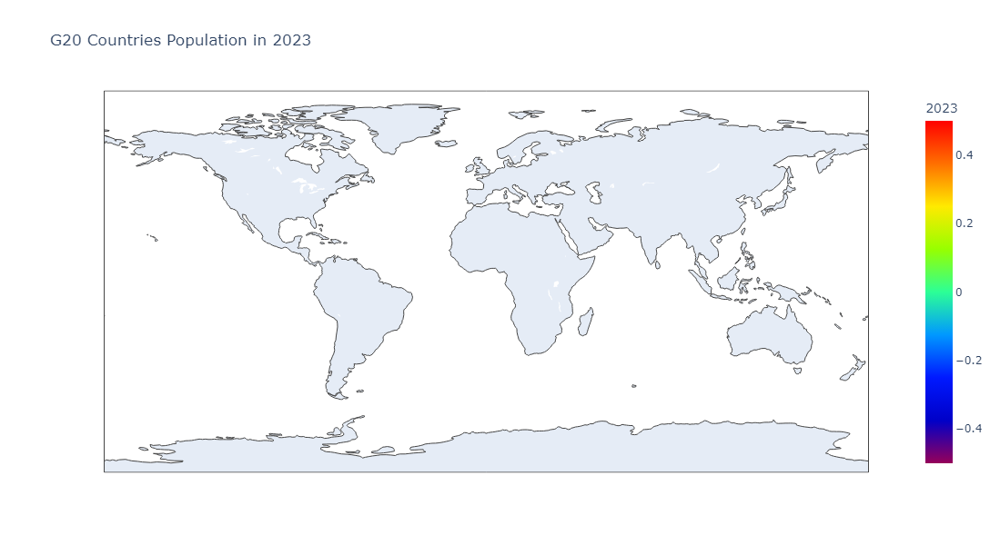

In [3]:
# most recent year, 2023
g20_population_2023 = g20_df[['Country Name', '2023']].dropna()

# Convert population values to numeric 
g20_population_2023['2023'] = pd.to_numeric(g20_population_2023['2023'], errors='coerce')

# Plot the choropleth map
fig = px.choropleth(
    g20_population_2023,
    locations='Country Name',  # Column with country names
    locationmode='country names',  # Location mode based on country names
    color='2023',  # Column for population data
    hover_name='Country Name',  # Hover data to display country names
    color_continuous_scale=px.colors.sequential.Rainbow,  # Color scale
    title='G20 Countries Population in 2023'
)
fig.update_layout(
    width=1000,  
    height=600   
)

# Show the map
fig.show()


# Human Development Index - 2014 to 2023

In [4]:
hdi_file_path = '../Final Project/Annual HDI - G20/Human Development Index.csv'
hdi_data = pd.read_csv(hdi_file_path)

hdi_data

,Country,Human Development Groups,HDI Rank (2021),Human Development Index (1990),Human Development Index (1991),Human Development Index (1992),Human Development Index (1993),Human Development Index (1994),Human Development Index (1995),Human Development Index (1996),...,Material footprint per capita (tonnes) (2012),Material footprint per capita (tonnes) (2013),Material footprint per capita (tonnes) (2014),Material footprint per capita (tonnes) (2015),Material footprint per capita (tonnes) (2016),Material footprint per capita (tonnes) (2017),Material footprint per capita (tonnes) (2018),Material footprint per capita (tonnes) (2019),Material footprint per capita (tonnes) (2020),Material footprint per capita (tonnes) (2021)
0,Argentina,Very High,47,0.723,0.730,0.735,0.739,0.744,0.745,0.751,...,15.69,16.74,16.57,17.85,16.95,18.75,16.88,15.81,15.81,15.81
1,Australia,Very High,5,0.865,0.867,0.869,0.873,0.873,0.882,0.884,...,49.09,45.97,47.80,46.91,46.32,48.27,47.70,46.82,46.82,46.82
2,Brazil,High,87,0.610,0.616,0.622,0.630,0.638,0.646,0.653,...,20.34,20.78,19.96,19.04,18.57,18.89,18.28,18.87,18.87,18.87
3,Canada,Very High,15,0.860,0.864,0.868,0.866,0.872,0.876,0.879,...,34.83,35.00,33.82,34.42,35.46,36.48,35.84,35.05,35.05,35.05
4,China,High,79,0.484,0.492,0.504,0.515,0.525,0.535,0.545,...,19.84,21.37,21.77,21.29,21.73,21.51,21.34,21.96,21.96,21.96
5,Germany,Very High,9,0.829,0.835,0.842,0.852,0.858,0.863,0.868,...,20.36,20.36,20.70,20.06,20.50,21.29,20.23,19.40,19.40,19.40
6,France,Very High,28,0.791,0.799,0.806,0.809,0.823,0.828,0.833,...,20.90,20.95,20.75,20.15,19.79,19.70,17.61,17.10,17.10,17.10
7,United Kingdom,Very High,18,0.804,0.809,0.816,0.820,0.828,0.828,0.834,...,17.94,17.86,19.09,18.97,18.27,18.20,18.01,17.85,17.85,17.85
8,Indonesia,High,114,0.526,0.532,0.540,0.548,0.558,0.569,0.578,...,6.58,6.50,6.53,6.65,6.34,6.48,6.66,6.77,6.77,6.77
9,India,Medium,132,0.434,0.437,0.442,0.446,0.452,0.458,0.466,...,4.71,4.70,4.60,4.76,4.78,4.84,5.11,5.23,5.23,5.23


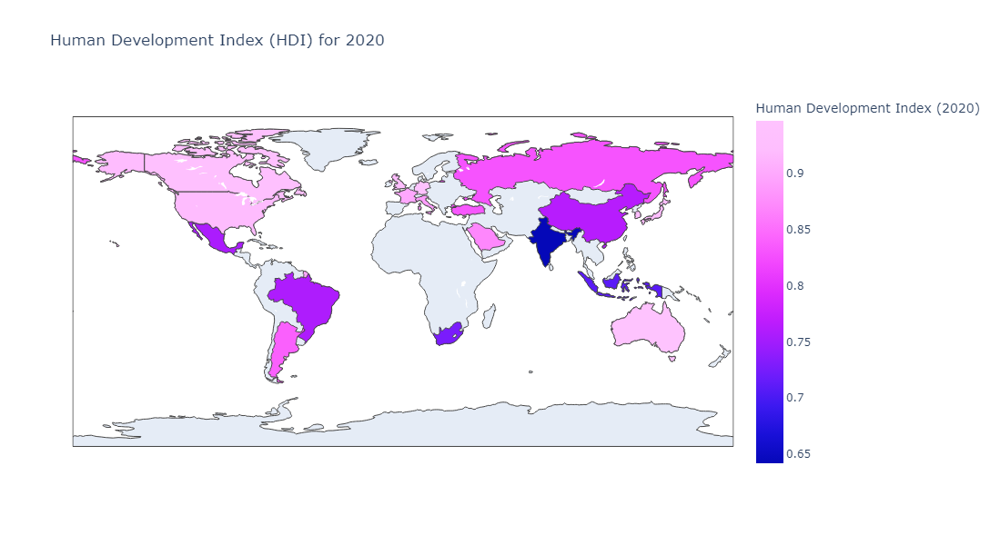

In [5]:

hdi_2020_column = 'Human Development Index (2020)'  

# Filter 2020
hdi_2020_data = hdi_data[['Country', hdi_2020_column]].dropna()

# Plot the world map 
fig = px.choropleth(
    hdi_2020_data,
    locations="Country",
    locationmode='country names',
    color=hdi_2020_column,
    hover_name="Country",
    color_continuous_scale=px.colors.sequential.Plotly3,
    title="Human Development Index (HDI) for 2020"
)
fig.update_layout(
    width=1000,  
    height=600   
)

fig.show()

______________________________________________________________________________________________________________________________________________________

# GDP Data

# G-20 Nominal GDP - From 2014 to 2023 (Trillion of USD)

In [6]:
gdp_file_path = '../Final Project/Annual GDP - G20/API_NY.GDP.MKTP.CD_DS2_en_csv_v2_3403845.csv'
gdp_data = pd.read_csv(gdp_file_path, skiprows=4)

# Filter years
gdp_years = [str(year) for year in range(2014, 2024)] 

# Filter G20 countries
g20_gdp_data = gdp_data[gdp_data['Country Name'].isin(g20_countries)]

# Select columns 
g20_gdp_filtered = g20_gdp_data[['Country Name'] + gdp_years]

# Converting GDP values to trillions of USD 
g20_gdp_trillions = g20_gdp_filtered.copy()

# Convert all the GDP values from USD to trillions of USD
g20_gdp_trillions[gdp_years] = g20_gdp_trillions[gdp_years].apply(lambda x: x / 1e12)

# Replace the 'Country Name' column with numbers from 1 to 25
g20_gdp_trillions.reset_index(drop=True, inplace=True)
g20_gdp_trillions.index = g20_gdp_trillions.index + 1

# Update the header to indicate that the GDP amounts are in USD trillions
g20_gdp_trillions.columns = ['Country Name'] + [f'{year} (GDP in USD Trillions)' for year in gdp_years]

g20_gdp_trillions



,Country Name,2014 (GDP in USD Trillions),2015 (GDP in USD Trillions),2016 (GDP in USD Trillions),2017 (GDP in USD Trillions),2018 (GDP in USD Trillions),2019 (GDP in USD Trillions),2020 (GDP in USD Trillions),2021 (GDP in USD Trillions),2022 (GDP in USD Trillions),2023 (GDP in USD Trillions)
1,Argentina,0.526320,0.594749,0.557532,0.643628,0.524820,0.447755,0.385741,0.487903,0.631133,0.640591
2,Australia,1.468600,1.351770,1.207580,1.326880,1.429730,1.394670,1.330380,1.559030,1.692960,1.723830
3,Brazil,2.456040,1.802210,1.795690,2.063510,1.916930,1.873290,1.476110,1.670650,1.951920,2.173670
4,Canada,1.805750,1.556510,1.527990,1.649270,1.725330,1.743730,1.655680,2.007470,2.161480,2.140090
5,China,10.475600,11.061600,11.233300,12.310500,13.894900,14.280000,14.687700,17.820500,17.881800,17.794800
6,Germany,3.889090,3.357590,3.469850,3.690850,3.974440,3.889180,3.887730,4.278500,4.082470,4.456080
7,France,2.855960,2.439190,2.472960,2.595150,2.790960,2.728870,2.647420,2.959360,2.779090,3.030900
8,United Kingdom,3.064710,2.927910,2.689110,2.680150,2.871340,2.851410,2.697810,3.141510,3.088840,3.340030
9,Indonesia,0.890815,0.860854,0.931877,1.015620,1.042270,1.119100,1.059050,1.186510,1.319080,1.371170
10,India,2.039130,2.103590,2.294800,2.651470,2.702930,2.835610,2.674850,3.167270,3.353470,3.549920


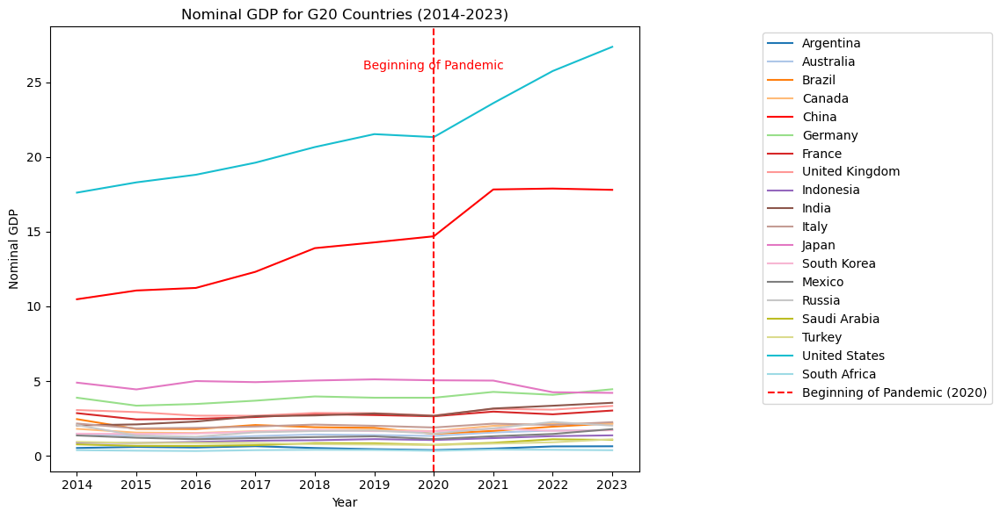

In [7]:

years = list(range(2014, 2024))

# Define x-tick positions and labels
x_ticks_positions = list(range(len(years)))  
x_ticks_labels = [str(year) for year in years]  

# Figsize
plt.figure(figsize=(12, 6))

# Get a color map to assign different colors for each country except China
cmap = plt.get_cmap('tab20')  
num_countries = len(g20_gdp_trillions['Country Name'])
colors = cmap(np.linspace(0, 1, num_countries))  

# Plot GDP growth for each G20 country from 2014 to 2023 (Make China look red)
for i, country in enumerate(g20_gdp_trillions['Country Name']):
    if country == 'China':
        # Set the color to red explicitly for China
        plt.plot(
            x_ticks_positions, 
            g20_gdp_trillions[g20_gdp_trillions['Country Name'] == country][[f"{year} (GDP in USD Trillions)" for year in years]].values.flatten(), 
            label=country, 
            color='red'
        )
    else:
        # Use color from the colormap for other countries
        plt.plot(
            x_ticks_positions, 
            g20_gdp_trillions[g20_gdp_trillions['Country Name'] == country][[f"{year} (GDP in USD Trillions)" for year in years]].values.flatten(), 
            label=country, 
            color=colors[i]
        )

# Set the x-ticks and labels
plt.xticks(x_ticks_positions, x_ticks_labels)

# Add a vertical line to indicate the beginning of the pandemic (2020)
plt.axvline(x=6, color='red', linestyle='--', label='Beginning of Pandemic (2020)')  # 6 corresponds to 2020

# Annotate the marker
plt.text(6, plt.ylim()[1] * 0.9, 'Beginning of Pandemic', color='red', ha='center')

# labels and title
plt.title('Nominal GDP for G20 Countries (2014-2023)')
plt.xlabel('Year')
plt.ylabel('Nominal GDP')
plt.legend(bbox_to_anchor=(1.2, 1), loc='upper left')
plt.tight_layout()

plt.show()


## Nominal GDP Resilience

In [8]:
gdp_years = ['2019', '2020', '2021', '2022', '2023']

g20_gdp_filtered = gdp_data[gdp_data['Country Name'].isin(g20_countries)]

g20_gdp_filtered = g20_gdp_filtered[['Country Name'] + gdp_years]

# Convert GDP values to trillions of USD 
g20_gdp_trillions = g20_gdp_filtered.copy()
g20_gdp_trillions[gdp_years] = g20_gdp_trillions[gdp_years].apply(lambda x: x / 1e12)

# Calculate the average GDP for each country from 2019 to 2023
g20_gdp_trillions['Average GDP (2019-2023)'] = g20_gdp_trillions[gdp_years].mean(axis=1)
def assign_grade(amount):
    if 0 <= amount < 1:
        return 10
    elif 1 <= amount < 2:
        return 20
    elif 2 <= amount < 3:
        return 30
    elif 3 <= amount < 4:
        return 40
    elif 4 <= amount < 5:
        return 50
    elif 5 <= amount < 10:
        return 60
    elif 10 <= amount < 15:
        return 70
    elif 15 <= amount < 20:
        return 80
    elif 20 <= amount < 25:
        return 90
    else:
        return 100

# Assign grades based on the average GDP
g20_gdp_trillions['Grade'] = g20_gdp_trillions['Average GDP (2019-2023)'].apply(assign_grade)

g20_gdp_trillions

,Country Name,2019,2020,2021,2022,2023,Average GDP (2019-2023),Grade
9,Argentina,0.447755,0.385741,0.487903,0.631133,0.640591,0.518625,10
13,Australia,1.394670,1.330380,1.559030,1.692960,1.723830,1.540174,20
29,Brazil,1.873290,1.476110,1.670650,1.951920,2.173670,1.829128,20
35,Canada,1.743730,1.655680,2.007470,2.161480,2.140090,1.941690,20
40,China,14.280000,14.687700,17.820500,17.881800,17.794800,16.492960,80
55,Germany,3.889180,3.887730,4.278500,4.082470,4.456080,4.118792,50
77,France,2.728870,2.647420,2.959360,2.779090,3.030900,2.829128,30
81,United Kingdom,2.851410,2.697810,3.141510,3.088840,3.340030,3.023920,40
106,Indonesia,1.119100,1.059050,1.186510,1.319080,1.371170,1.210982,20
109,India,2.835610,2.674850,3.167270,3.353470,3.549920,3.116224,40


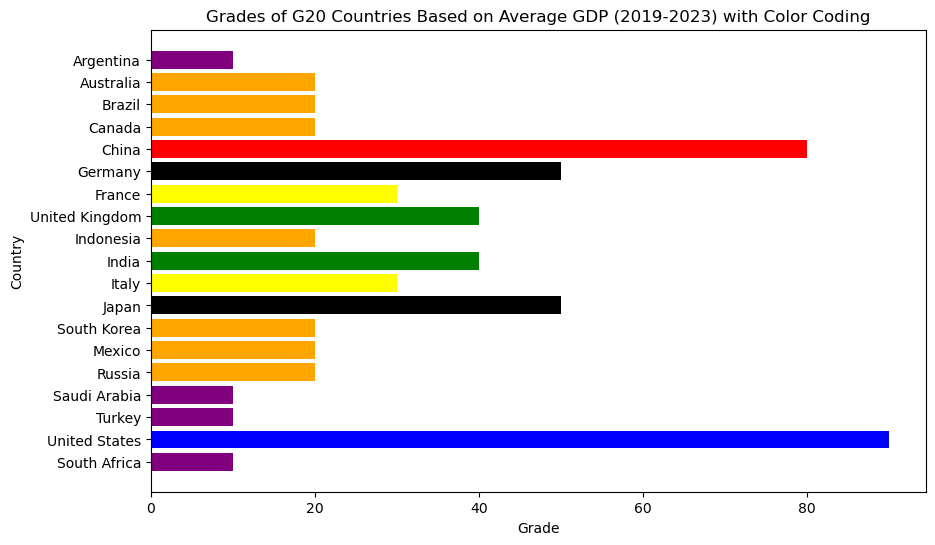

In [9]:
def get_color(grade):
    if grade == 10:
        return 'purple'
    elif grade == 20:
        return 'orange'
    elif grade == 30:
        return 'yellow'
    elif grade == 40:
        return 'green'
    elif grade == 50:
        return 'black'
    elif grade == 60:
        return 'cyan' 
    elif grade == 70:
        return 'pink'
    elif grade == 80:
        return 'red'
    elif grade == 90:
        return 'blue'
    else:
        return 'magenta'

# Color
colors = g20_gdp_trillions['Grade'].apply(get_color)

# plot the graph with colors mapped according to the grades
plt.figure(figsize=(10, 6))

# Plot the horizontal bar chart for each country's grade with assigned colors
plt.barh(g20_gdp_trillions['Country Name'], g20_gdp_trillions['Grade'], color=colors)


plt.xlabel('Grade')
plt.ylabel('Country')
plt.title('Grades of G20 Countries Based on Average GDP (2019-2023) with Color Coding')

plt.gca().invert_yaxis()  # Invert y-axis to display the countries in order
plt.show()



# G-20 GDP per Capita (USD)

In [10]:
file_path_percapita = '../Final Project/Annual GDP per Capita - G20/API_NY.GDP.PCAP.CD_DS2_en_csv_v2_31681.csv'
data_percapita = pd.read_csv(file_path_percapita, skiprows=4)

data_percapita.head()

years = [str(year) for year in range(2014, 2024)]

g20_gdp_percapita = data_percapita[data_percapita['Country Name'].isin(g20_countries)][['Country Name'] + years]

g20_gdp_percapita


,Country Name,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
9,Argentina,12334.798250,13789.060420,12790.264140,14613.035650,11795.162750,9963.674162,8500.837939,10650.860460,13650.604630,13730.514710
13,Australia,62558.243880,56758.869200,49918.793930,53954.553490,57273.520480,55049.571920,51868.247560,60697.245440,65077.676670,64711.765600
29,Brazil,12071.404460,8783.215424,8680.736469,9896.718895,9121.020995,8845.324149,6923.699912,7794.880979,9065.497334,10043.623920
35,Canada,50960.843120,43594.194100,42314.061580,45129.628120,46539.176160,46352.869340,43537.839300,52496.844170,55509.393180,53371.697430
40,China,7636.074340,8016.445595,8094.390167,8817.045608,9905.406383,10143.860220,10408.719550,12617.505100,12662.583170,12614.060990
55,Germany,48023.869980,41103.256440,42136.120790,44652.589170,47939.278290,46805.138430,46749.476230,51426.750370,48717.991140,52745.755710
77,France,43068.548720,36652.922310,37062.533570,38781.049490,41557.854860,40494.898290,39179.744260,43671.308410,40886.253270,44460.817850
81,United Kingdom,47439.616590,44964.391140,40985.235140,40572.121480,43203.814110,42662.535370,40217.009010,46869.759060,45564.156940,48866.603960
106,Indonesia,3476.624854,3322.581679,3558.818852,3839.785075,3902.661676,4151.227554,3895.618152,4334.231454,4787.912364,4940.549805
109,India,1559.863779,1590.174331,1714.279537,1957.969813,1974.377731,2050.163800,1915.551588,2250.179018,2366.309609,2484.845429


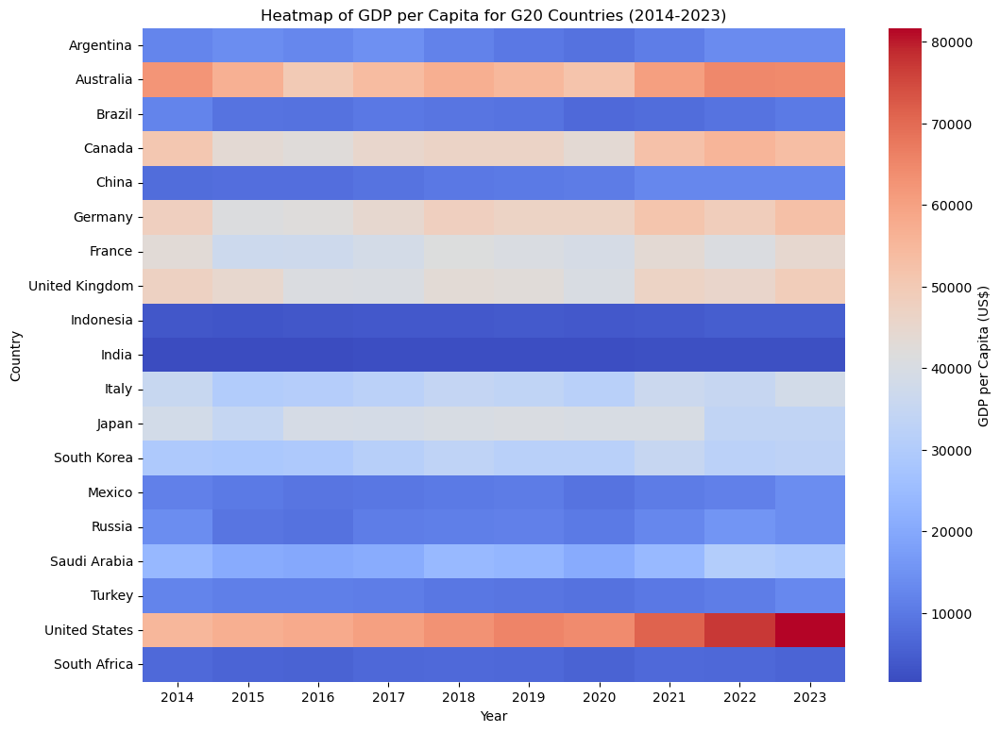

In [11]:
g20_gdp_heatmap_data = g20_gdp_percapita.set_index('Country Name')

# Convert the values to numeric (in case some values are strings)
g20_gdp_heatmap_data = g20_gdp_heatmap_data.apply(pd.to_numeric, errors='coerce')

# Create a heatmap using seaborn
plt.figure(figsize=(12, 9))
sns.heatmap(g20_gdp_heatmap_data, cmap="coolwarm", annot=False, cbar_kws={'label': 'GDP per Capita (US$)'})

plt.title('Heatmap of GDP per Capita for G20 Countries (2014-2023)')
plt.xlabel('Year')
plt.ylabel('Country')

plt.show()


## G-20 GDP per Capita (USD) Resilience

In [12]:
data_percapita_years = ['2019', '2020', '2021', '2022', '2023']

data_percapita_filtered = data_percapita[data_percapita['Country Name'].isin(g20_countries)]

data_percapita_filtered = data_percapita_filtered[['Country Name'] + data_percapita_years]

# Calculate the GDP per capita growth from 2019 to 2023
data_percapita_filtered['GDP per Capita Growth (2019-2023)'] = ((data_percapita_filtered['2023'] - data_percapita_filtered['2019']) / data_percapita_filtered['2019']) * 100

# Add a column with the % equivalent of GDP per Capita Growth
data_percapita_filtered['GDP per Capita Growth (%)'] = data_percapita_filtered['GDP per Capita Growth (2019-2023)'].apply(lambda x: f"{x:.2f}%")

data_percapita_filtered = data_percapita_filtered.drop(columns=['GDP per Capita Growth (2019-2023)'])

# Function to assign grades based on GDP per capita growth percentage
def assign_grade_growth(amount):
    if amount < 0:  # Negative growth
        return 10
    elif 0 <= amount < 5:
        return 20
    elif 5 <= amount < 10:
        return 30
    elif 10 <= amount < 15:
        return 40
    elif 15 <= amount < 20:
        return 50
    elif 20 <= amount < 25:
        return 60
    elif 25 <= amount < 30:
        return 70
    elif 30 <= amount < 40:
        return 80
    elif 40 <= amount < 50:
        return 90
    else:  # Growth greater than or equal to 50%
        return 100

# Assign grades based on the GDP per capita growth (2019-2023)
data_percapita_filtered['Grade'] = data_percapita_filtered['GDP per Capita Growth (%)'].str.rstrip('%').astype(float).apply(assign_grade_growth)

data_percapita_filtered

,Country Name,2019,2020,2021,2022,2023,GDP per Capita Growth (%),Grade
9,Argentina,9963.674162,8500.837939,10650.860460,13650.604630,13730.514710,37.81%,80
13,Australia,55049.571920,51868.247560,60697.245440,65077.676670,64711.765600,17.55%,50
29,Brazil,8845.324149,6923.699912,7794.880979,9065.497334,10043.623920,13.55%,40
35,Canada,46352.869340,43537.839300,52496.844170,55509.393180,53371.697430,15.14%,50
40,China,10143.860220,10408.719550,12617.505100,12662.583170,12614.060990,24.35%,60
55,Germany,46805.138430,46749.476230,51426.750370,48717.991140,52745.755710,12.69%,40
77,France,40494.898290,39179.744260,43671.308410,40886.253270,44460.817850,9.79%,30
81,United Kingdom,42662.535370,40217.009010,46869.759060,45564.156940,48866.603960,14.54%,40
106,Indonesia,4151.227554,3895.618152,4334.231454,4787.912364,4940.549805,19.01%,50
109,India,2050.163800,1915.551588,2250.179018,2366.309609,2484.845429,21.20%,60


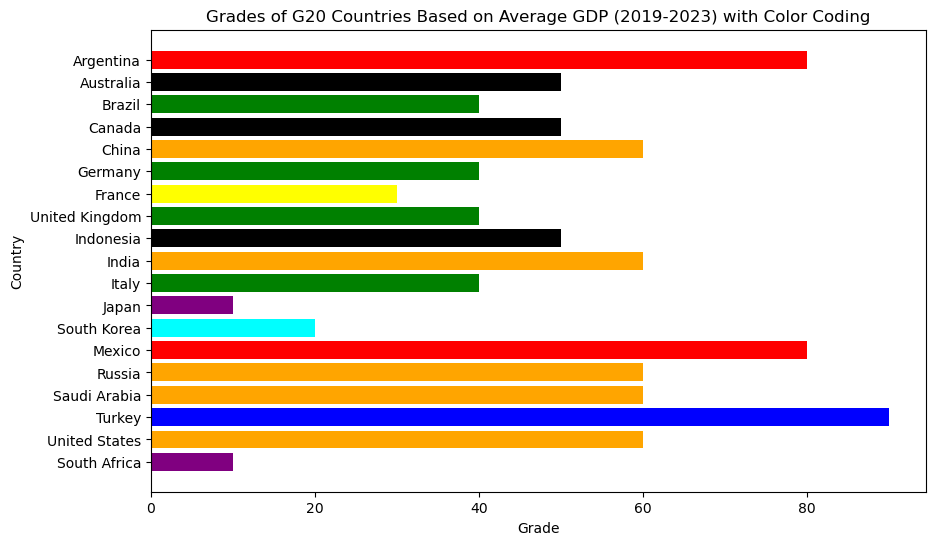

In [13]:
# Define a function to map grades to colors
def get_color(grade):
    if grade == 10:
        return 'purple'
    elif grade == 20:
        return 'cyan'
    elif grade == 30:
        return 'yellow'
    elif grade == 40:
        return 'green'
    elif grade == 50:
        return 'black'
    elif grade == 60:
        return 'orange' 
    elif grade == 70:
        return 'pink'
    elif grade == 80:
        return 'red'
    elif grade == 90:
        return 'blue'
    else:
        return 'magenta'

# Apply the color mapping based on the grade
colors = data_percapita_filtered['Grade'].apply(get_color)

plt.figure(figsize=(10, 6))

plt.barh(data_percapita_filtered['Country Name'], data_percapita_filtered['Grade'], color=colors)

plt.xlabel('Grade')
plt.ylabel('Country')
plt.title('Grades of G20 Countries Based on Average GDP (2019-2023) with Color Coding')

plt.gca().invert_yaxis()  # Invert y-axis to display the countries in order
plt.show()


# G-20 Annual GDP Growth - From 2014 to 2023 (%)

In [14]:
growth_file_path = '../Final Project/Annual GDP Growth - G20/API_NY.GDP.MKTP.KD.ZG_DS2_en_csv_v2_59.csv'
growth_data = pd.read_csv(growth_file_path, skiprows=4)

growth_data_g20  = growth_data [growth_data ['Country Name'].isin(g20_countries)]

columns_to_keep = ['Country Name', 'Country Code'] + \
                  [str(year) for year in range(2014, 2024)]
growth_data_g20 = growth_data_g20[columns_to_keep]

# Select the columns containing the growth values (which are numeric columns)
growth_columns = [col for col in growth_data_g20.columns if 'Growth %' in col]

# Convert the growth values to percentages by multiplying by 100
growth_data_g20[growth_columns] = growth_data_g20[growth_columns] * 100

# Add a header clarification
growth_data_g20.rename(columns=lambda x: f"{x} (% of GDP Growth)" if x.isdigit() else x, inplace=True)

growth_data_g20.reset_index(drop=True, inplace=True)
growth_data_g20.index = growth_data_g20.index + 1

growth_data_g20

,Country Name,Country Code,2014 (% of GDP Growth),2015 (% of GDP Growth),2016 (% of GDP Growth),2017 (% of GDP Growth),2018 (% of GDP Growth),2019 (% of GDP Growth),2020 (% of GDP Growth),2021 (% of GDP Growth),2022 (% of GDP Growth),2023 (% of GDP Growth)
1,Argentina,ARG,-2.512615,2.731160,-2.080328,2.818503,-2.617396,-2.000861,-9.900485,10.718010,4.956370,-1.550502
2,Australia,AUS,2.607401,2.201810,2.779143,2.318709,2.906363,2.181109,-0.334686,2.111831,4.268946,3.016988
3,Brazil,BRA,0.503956,-3.545763,-3.275917,1.322869,1.783667,1.220778,-3.276759,4.762604,3.016694,2.908480
4,Canada,CAN,2.873467,0.649971,1.038551,3.033835,2.742963,1.908432,-5.038233,5.286957,3.819866,1.065994
5,China,CHN,7.425764,7.041329,6.848762,6.947201,6.749774,5.950501,2.238638,8.448469,2.989084,5.200000
6,Germany,DEU,2.209543,1.491932,2.230000,2.680231,0.981233,1.075472,-3.826769,3.163820,1.806209,-0.304935
7,France,FRA,0.956183,1.112912,1.095464,2.291420,1.865066,1.842972,-7.540459,6.435210,2.454758,0.703719
8,United Kingdom,GBR,3.195782,2.220258,1.921063,2.655070,1.403792,1.641611,-10.359901,8.674904,4.345229,0.104018
9,Indonesia,IDN,5.006668,4.876322,5.033069,5.069786,5.174292,5.019288,-2.065512,3.702886,5.307419,5.048106
10,India,IND,7.410228,7.996254,8.256306,6.795383,6.453851,3.871437,-5.777725,9.689592,6.987039,7.583971


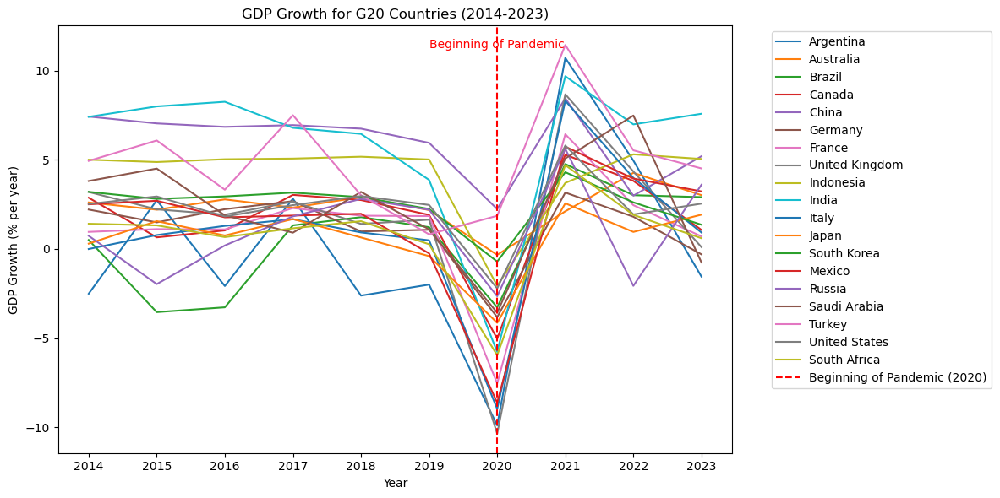

In [15]:
years = list(range(2014, 2024))

# Define x-tick positions and labels
x_ticks_positions = list(range(len(years)))  # Positions for 10 years (0 to 9)
x_ticks_labels = [str(year) for year in years]  # Labels from 2014 to 2023

plt.figure(figsize=(12, 6))

# Plot GDP growth for each G20 country from 2014 to 2023
for country in growth_data_g20['Country Name']:
    plt.plot(x_ticks_positions, growth_data_g20[growth_data_g20['Country Name'] == country][[f"{year} (% of GDP Growth)" for year in years]].values.flatten(), label=country)

# Set the x-ticks and labels
plt.xticks(x_ticks_positions, x_ticks_labels)

# Add a vertical line to indicate the beginning of the pandemic (2020)
plt.axvline(x=6, color='red', linestyle='--', label='Beginning of Pandemic (2020)')  # 6 corresponds to 2020

# Annotate the marker
plt.text(6, plt.ylim()[1] * 0.9, 'Beginning of Pandemic', color='red', ha='center')

plt.title('GDP Growth for G20 Countries (2014-2023)')
plt.xlabel('Year')
plt.ylabel('GDP Growth (% per year)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()


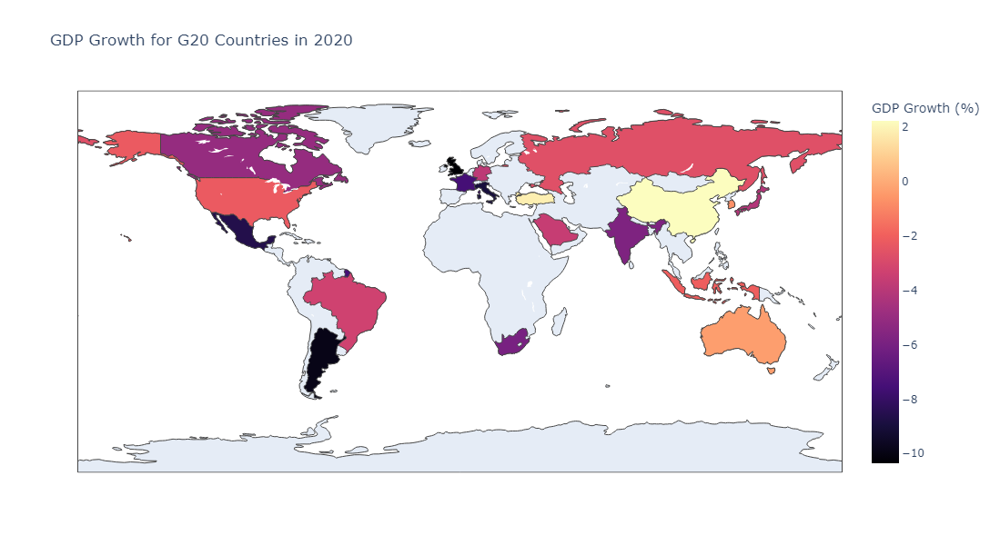

In [16]:
growth_data_filtered = growth_data[growth_data['Country Name'].isin(g20_countries)]

growth_data_filtered = growth_data_filtered[['Country Name', 'Country Code', '2020']].rename(columns={'2020': 'GDP Growth 2020'})

# plotly express
fig = px.choropleth(
    growth_data_filtered,
    locations="Country Code",
    color="GDP Growth 2020",
    hover_name="Country Name",
    color_continuous_scale=px.colors.sequential.Magma,
    title="GDP Growth for G20 Countries in 2020",
    labels={'GDP Growth 2020': 'GDP Growth (%)'}
)

fig.update_layout(
    width=1000,  
    height=600   
)

fig.show()


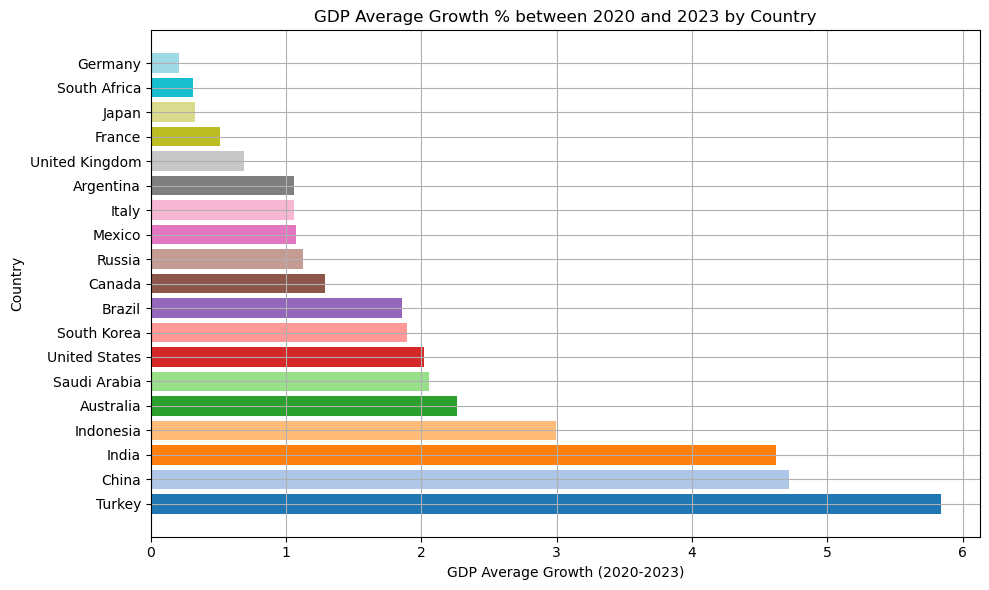

In [17]:
gdp_data = growth_data[growth_data['Country Name'].isin(g20_countries)][['Country Name', '2020', '2021', '2022', '2023']]

# Calculate the growth difference between 2020 and 2023
gdp_data['Growth Difference (2020-2023)'] = (gdp_data['2020'] + gdp_data['2021']+ gdp_data['2022'] + gdp_data['2023']) / 4

# Prepare data for plotting
gdp_data_sorted = gdp_data.sort_values('Growth Difference (2020-2023)', ascending=False)
countries_sorted = gdp_data_sorted['Country Name']
growth_diff_sorted = gdp_data_sorted['Growth Difference (2020-2023)']

# Get a color map and assign a unique color to each bar
cmap = plt.get_cmap('tab20')  # Using 'tab20' colormap for up to 20 unique colors
colors = cmap(np.linspace(0, 1, len(countries_sorted)))  # Generate colors based on number of countries

# Plot the data with different colors for each bar
plt.figure(figsize=(10, 6))
plt.barh(countries_sorted, growth_diff_sorted, color=colors)
plt.xlabel('GDP Average Growth (2020-2023)')
plt.ylabel('Country')
plt.title('GDP Average Growth % between 2020 and 2023 by Country')
plt.grid(True)
plt.tight_layout()

plt.show()


## G-20 Annual GDP Growth Resilience

In [18]:
growth_data_years = ['2019', '2020', '2021', '2022', '2023']

growth_data_g20  = growth_data [growth_data ['Country Name'].isin(g20_countries)]

growth_data_g20  = growth_data_g20 [['Country Name'] + growth_data_years]

# Calculate the GDP per capita growth from 2019 to 2023
growth_data_g20 ['GDP Growth % (2019-2023)'] = ((growth_data_g20 ['2023'] - growth_data_g20 ['2019']) / growth_data_g20 ['2019']) * 100

# Add a column with the % equivalent of GDP per Capita Growth
growth_data_g20 ['GDP Growth (%)'] = growth_data_g20 ['GDP Growth % (2019-2023)'].apply(lambda x: f"{x:.2f}%")

# Remove the 'GDP per Capita Growth (2019-2023)' column
growth_data_g20  = growth_data_g20 .drop(columns=['GDP Growth % (2019-2023)'])

# Function to assign grades based on GDP per capita growth percentage
def assign_grade_growth(amount):
    if amount < -1000:  # Negative growth
        return 0
    elif -1000 <= amount < -100:
        return 10
    elif -100 <= amount < 0:
        return 20
    elif 0 <= amount < 10:
        return 30
    elif 10 <= amount < 30:
        return 40
    elif 30 <= amount < 50:
        return 50
    elif 50 <= amount < 70:
        return 60
    elif 70 <= amount < 90:
        return 70
    elif 90 <= amount < 100:
        return 80
    elif 100 <= amount < 200:
        return 90
    else:  # Growth greater than or equal to 50%
        return 100

# Assign grades based on the GDP per capita growth (2019-2023)
growth_data_g20 ['Grade'] = growth_data_g20 ['GDP Growth (%)'].str.rstrip('%').astype(float).apply(assign_grade_growth)

growth_data_g20 

,Country Name,2019,2020,2021,2022,2023,GDP Growth (%),Grade
9,Argentina,-2.000861,-9.900485,10.718010,4.956370,-1.550502,-22.51%,20
13,Australia,2.181109,-0.334686,2.111831,4.268946,3.016988,38.32%,50
29,Brazil,1.220778,-3.276759,4.762604,3.016694,2.908480,138.25%,90
35,Canada,1.908432,-5.038233,5.286957,3.819866,1.065994,-44.14%,20
40,China,5.950501,2.238638,8.448469,2.989084,5.200000,-12.61%,20
55,Germany,1.075472,-3.826769,3.163820,1.806209,-0.304935,-128.35%,10
77,France,1.842972,-7.540459,6.435210,2.454758,0.703719,-61.82%,20
81,United Kingdom,1.641611,-10.359901,8.674904,4.345229,0.104018,-93.66%,20
106,Indonesia,5.019288,-2.065512,3.702886,5.307419,5.048106,0.57%,30
109,India,3.871437,-5.777725,9.689592,6.987039,7.583971,95.90%,80


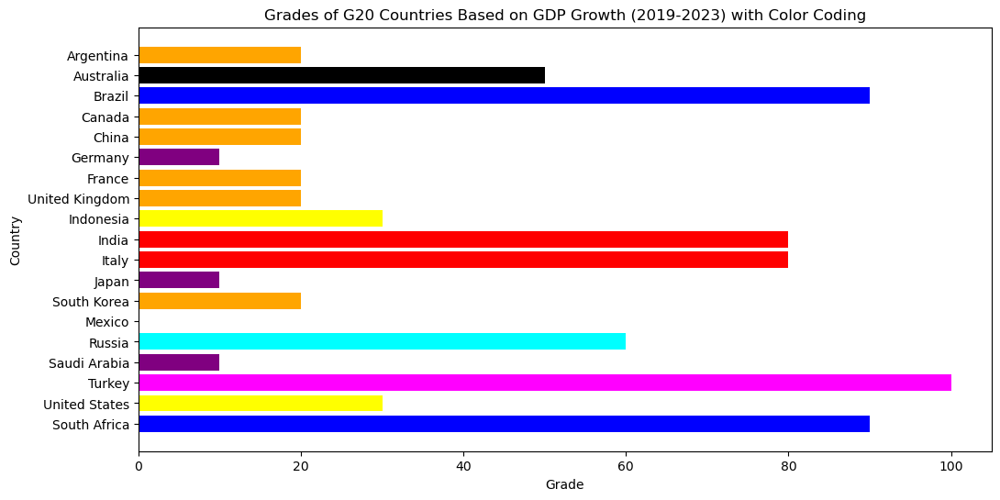

In [19]:
def get_color(grade):
    if grade == 10:
        return 'purple'
    elif grade == 20:
        return 'orange'
    elif grade == 30:
        return 'yellow'
    elif grade == 40:
        return 'green'
    elif grade == 50:
        return 'black'
    elif grade == 60:
        return 'cyan' 
    elif grade == 70:
        return 'pink'
    elif grade == 80:
        return 'red'
    elif grade == 90:
        return 'blue'
    else:
        return 'magenta'

colors = growth_data_g20['Grade'].apply(get_color)

plt.figure(figsize=(12, 6))

plt.barh(growth_data_g20['Country Name'], growth_data_g20['Grade'], color=colors)

plt.xlabel('Grade')
plt.ylabel('Country')
plt.title('Grades of G20 Countries Based on GDP Growth (2019-2023) with Color Coding')

plt.gca().invert_yaxis()

plt.show()


# Annual Expenses by GDP - 2014 to 2023(%)

In [20]:
expenses_file_path = '../Final Project/Annual Expenses GDP - G20/API_GC.XPN.TOTL.GD.ZS_DS2_en_csv_v2_3442168.csv'
expenses_data = pd.read_csv(expenses_file_path, skiprows=4)

expenses_data_g20 = expenses_data [expenses_data ['Country Name'].isin(g20_countries)]

columns_to_keep = ['Country Name', 'Country Code'] + \
                  [str(year) for year in range(2014, 2024)]
expenses_data_g20 = expenses_data_g20[columns_to_keep]

# Select the columns containing the growth values (which are numeric columns)
expenses_columns = [col for col in expenses_data_g20.columns if 'Expenses %' in col]

for year in range(2014, 2024):
    year_col = str(year)
    expenses_data_g20[year_col] = expenses_data_g20[year_col] / 1000

# Add a header 
expenses_data_g20.rename(columns=lambda x: f"{x} (Expenses %)" if x.isdigit() else x, inplace=True)

expenses_data_g20.reset_index(drop=True, inplace=True)
expenses_data_g20.index = expenses_data_g20.index + 1

expenses_data_g20 

,Country Name,Country Code,2014 (Expenses %),2015 (Expenses %),2016 (Expenses %),2017 (Expenses %),2018 (Expenses %),2019 (Expenses %),2020 (Expenses %),2021 (Expenses %),2022 (Expenses %),2023 (Expenses %)
1,Argentina,ARG,0.024570,0.025008,0.026180,0.024283,0.022688,0.022036,0.025841,0.022834,0.021964,NaN
2,Australia,AUS,0.026252,0.026755,0.026967,0.026608,0.026194,0.026140,0.030210,0.032585,0.027627,NaN
3,Brazil,BRA,0.032069,0.036924,0.036492,0.036248,0.035454,0.034787,0.038481,0.031794,0.034134,NaN
4,Canada,CAN,0.016402,0.017060,0.017499,0.017607,0.017541,0.018106,0.028571,0.022666,0.018497,NaN
5,China,CHN,0.040911,0.040444,0.038384,0.037022,0.036802,0.035953,0.039665,0.037159,0.032683,NaN
6,Germany,DEU,0.028052,0.027988,0.027903,0.028078,0.027922,0.028387,0.032594,0.033255,0.032080,NaN
7,France,FRA,0.048289,0.047992,0.047882,0.047708,0.046773,0.046302,0.051920,0.049908,0.049002,NaN
8,United Kingdom,GBR,0.039405,0.038438,0.037250,0.037099,0.037525,0.036688,0.047962,0.043718,0.041795,NaN
9,Indonesia,IDN,0.015905,0.014501,0.014873,0.014299,0.014819,0.014495,0.016540,0.015509,0.015804,NaN
10,India,IND,0.014803,0.015126,0.015272,0.015614,0.015663,0.015804,0.014299,0.016540,0.015272,NaN


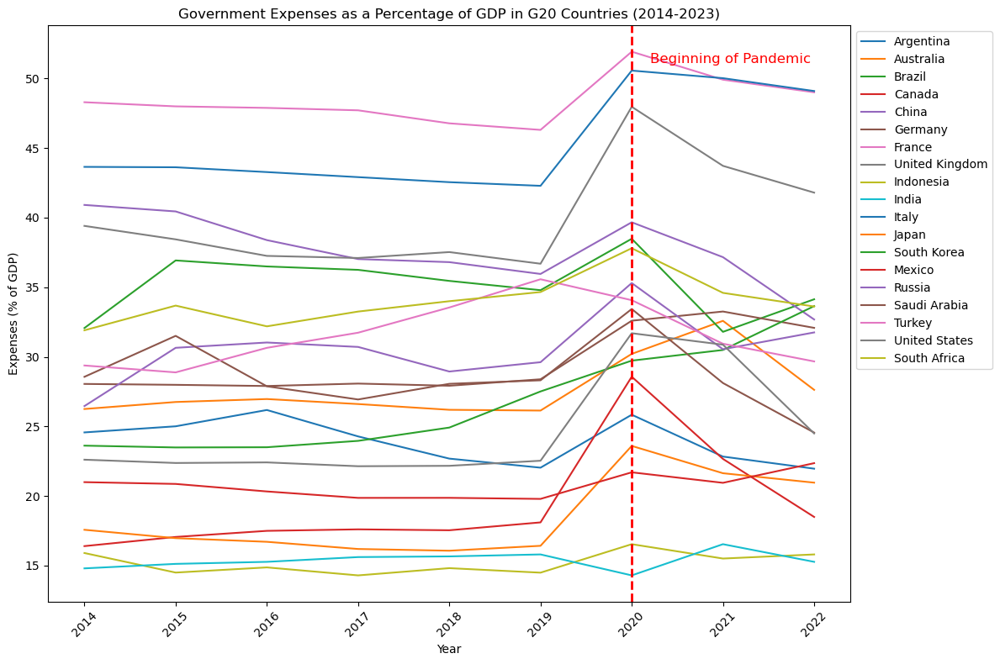

In [21]:
expenses_data_g20 = expenses_data[expenses_data['Country Name'].isin(g20_countries)]

columns_to_keep = ['Country Name'] + [str(year) for year in range(2014, 2023)]
expenses_data_g20 = expenses_data_g20[columns_to_keep]

# Replace NaN values with 0 for plotting
expenses_data_g20.fillna(0, inplace=True)

# Transpose the data for easier plotting
expenses_data_g20_transposed = expenses_data_g20.set_index('Country Name').T

# Convert the index to integers (for the years)
expenses_data_g20_transposed.index = expenses_data_g20_transposed.index.astype(int)

plt.figure(figsize=(12, 8))

for country in expenses_data_g20_transposed.columns:
    plt.plot(expenses_data_g20_transposed.index, expenses_data_g20_transposed[country], label=country)

plt.axvline(x=2020, color='red', linestyle='--', linewidth=2)
plt.text(2020.2, plt.ylim()[1]*0.95, 'Beginning of Pandemic', color='red', fontsize=12)

plt.xlabel('Year')
plt.ylabel('Expenses (% of GDP)')
plt.title('Government Expenses as a Percentage of GDP in G20 Countries (2014-2023)')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


## Annual Expenses by GDP - Resilience

In [22]:
expenses_data_years = ['2019', '2020', '2021', '2022']

expenses_data_g20 ['GDP Expenses (2019-2022)'] = ((expenses_data_g20 ['2022'] - expenses_data_g20 ['2019']) / expenses_data_g20 ['2019']) * 100

expenses_data_g20 ['GDP Expenses (%)'] = expenses_data_g20 ['GDP Expenses (2019-2022)'].apply(lambda x: f"{x:.2f}%")

expenses_data_g20  = expenses_data_g20 .drop(columns=['GDP Expenses (2019-2022)'])

def assign_grade_growth(amount):
    if amount < -1000:  # Negative growth
        return 0
    elif -1000 <= amount < -100:
        return 10
    elif -100 <= amount < 0:
        return 20
    elif 0 <= amount < 10:
        return 30
    elif 10 <= amount < 30:
        return 40
    elif 30 <= amount < 50:
        return 50
    elif 50 <= amount < 70:
        return 60
    elif 70 <= amount < 90:
        return 70
    elif 90 <= amount < 100:
        return 80
    elif 100 <= amount < 200:
        return 90
    else:  
        return 100

# Assign grades based on the GDP per capita growth (2019-2023)
expenses_data_g20 ['Grade'] = expenses_data_g20 ['GDP Expenses (%)'].str.rstrip('%').astype(float).apply(assign_grade_growth)

expenses_data_g20

,Country Name,2014,2015,2016,2017,2018,2019,2020,2021,2022,GDP Expenses (%),Grade
9,Argentina,24.569781,25.008393,26.179916,24.282532,22.687781,22.036481,25.840531,22.833976,21.964015,-0.33%,20
13,Australia,26.251692,26.754858,26.967466,26.607756,26.194072,26.139950,30.210451,32.584886,27.626830,5.69%,30
29,Brazil,32.069399,36.924420,36.491601,36.247654,35.454000,34.787453,38.481161,31.793879,34.134461,-1.88%,20
35,Canada,16.402050,17.059779,17.498604,17.606595,17.540900,18.105710,28.571474,22.665639,18.496536,2.16%,30
40,China,40.910777,40.444201,38.383615,37.022153,36.802246,35.953191,39.664884,37.159361,32.682535,-9.10%,20
55,Germany,28.052182,27.988190,27.902920,28.078239,27.922120,28.387386,32.594448,33.254530,32.080190,13.01%,40
77,France,48.289418,47.991978,47.881926,47.707991,46.773207,46.302461,51.920135,49.908282,49.002081,5.83%,30
81,United Kingdom,39.405234,38.438238,37.250263,37.099000,37.524764,36.688003,47.961638,43.718365,41.794770,13.92%,40
106,Indonesia,15.905366,14.501318,14.872984,14.299029,14.819096,14.494689,16.540028,15.509163,15.803951,9.03%,30
109,India,14.803138,15.125690,15.271950,15.614110,15.663132,15.803951,14.299029,16.540028,15.271950,-3.37%,20


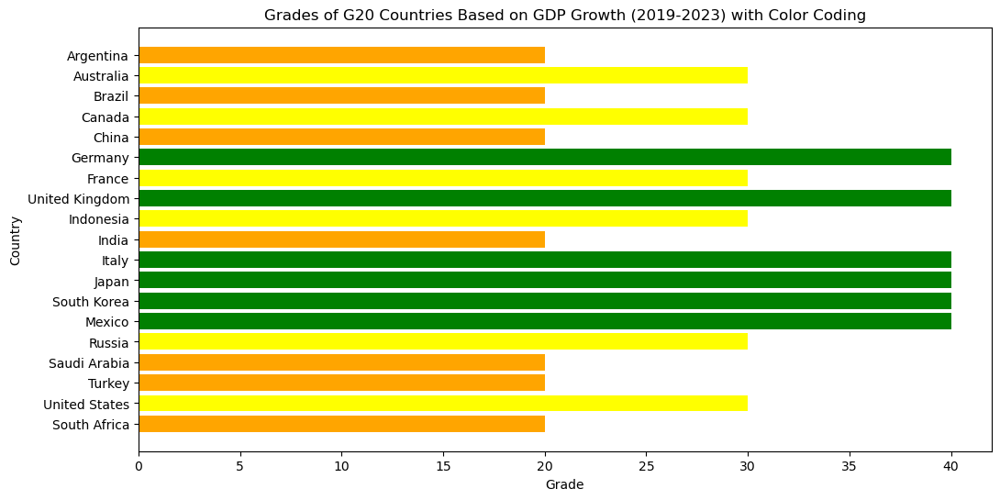

In [23]:
# Define a function to map grades to colors
def get_color(grade):
    if grade == 10:
        return 'purple'
    elif grade == 20:
        return 'orange'
    elif grade == 30:
        return 'yellow'
    elif grade == 40:
        return 'green'
    elif grade == 50:
        return 'black'
    elif grade == 60:
        return 'cyan' 
    elif grade == 70:
        return 'pink'
    elif grade == 80:
        return 'red'
    elif grade == 90:
        return 'blue'
    else:
        return 'magenta'

colors = expenses_data_g20['Grade'].apply(get_color)

plt.figure(figsize=(12, 6))

# Plot the horizontal bar chart for each country's grade with assigned colors
plt.barh(expenses_data_g20['Country Name'], expenses_data_g20['Grade'], color=colors)

plt.xlabel('Grade')
plt.ylabel('Country')
plt.title('Grades of G20 Countries Based on GDP Growth (2019-2023) with Color Coding')

plt.gca().invert_yaxis()

plt.show()

______________________________________________________________________________________________________________________________________________________

# COVID -19 Confrimed Cases and Deaths in G-20 Countries

## COVID-19 Confrimed Cases

In [24]:
file_path = '../Final Project/Annual COVID-19 Cases - G20/time_series_covid19_confirmed_global.csv'
covid_g20 = pd.read_csv(file_path)

# Remove the columns: Province/State, Lat, Long
covid_g20 = covid_g20.drop(columns=['Province/State', 'Lat', 'Long'], errors='ignore')

# Filter the data for G20 countries using the 'Country/Region' column directly
covid_filtered_g20 = covid_g20[covid_g20['Country/Region'].isin(g20_countries)]

# Group by 'Country/Region' to sum any duplicate entries
covid_filtered_g20 = covid_filtered_g20.groupby('Country/Region').sum()

# Define the function to parse dates from columns
def try_parse_dates(columns):
    parsed_dates = []
    for col in columns:
        try:
            #  '%m/%d/%y' format
            parsed_dates.append(pd.to_datetime(col, format='%m/%d/%y', errors='coerce'))
        except ValueError:
            # (Not a Time)
            parsed_dates.append(pd.NaT)
    return parsed_dates

# Apply the parsing function to the columns
parsed_columns = try_parse_dates(covid_filtered_g20.columns)

# Retain only the columns that were parsed successfully 
valid_columns = [col for col, date in zip(covid_filtered_g20.columns, parsed_columns) if date is not pd.NaT]

# process the data with only valid columns
covid_g20_valid = covid_filtered_g20[valid_columns]

# Convert the valid columns to datetime format
covid_g20_valid.columns = pd.to_datetime(covid_g20_valid.columns, format='%m/%d/%y', errors='coerce')

# Resample the data by month and sum it up
monthly_covid_g20 = covid_g20_valid.resample('M', axis=1).sum()

monthly_covid_g20


,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,...,2022-05-31,2022-06-30,2022-07-31,2022-08-31,2022-09-30,2022-10-31,2022-11-30,2022-12-31,2023-01-31,2023-02-28
Country/Region,,,,,,,,,,,,,,,,,,,,,
Argentina,0,0,6437,58438,210812,819697,2732325,6469206,11708175,19903748,...,174093078,168070187,180078714,183360295,174666901,184609602,175028482,186753336,190485935,160686358
Australia,38,265,34823,119018,134942,135489,254966,467164,484801,521963,...,132368746,142284824,171980765,188680473,183268520,196459780,190422466,209495741,214165460,181617848
Brazil,0,5,36921,880066,6397708,20166212,42847089,67921663,82506017,101316995,...,585348189,573495909,636633903,651534837,622902244,660836167,630924329,684875757,697712197,591929209
Canada,30,257,71428,779946,1589875,1831821,2141500,2379122,2680860,4046674,...,73361105,70893356,77004771,79224835,76590066,82548312,79578688,85293753,86478475,73497289
China,38008,1261138,1549602,1554100,1657723,1585158,1707044,1783354,1713563,1834875,...,39695388,38139305,42094029,45785178,48747309,54923816,60951184,82628717,92753289,78456345
France,30,369,396218,2751900,3502928,3608370,4144354,5320931,9184896,20401792,...,561263220,549846055,636335340,656892179,634533541,697706217,677409352,745124353,754047426,636771382
Germany,18,374,474087,2581469,3360622,3420097,3862167,4395043,4929880,7685773,...,494082643,493737623,572338756,604696631,591048583,665958978,652284015,704942373,715975873,608708955
India,2,51,9843,385850,2429134,7927116,24008729,57973120,100740730,147087344,...,819639911,780207605,833422095,842699746,801970672,848177487,804074376,848882579,848980526,714984607
Indonesia,0,0,11835,132078,394914,837970,1748319,2894217,4531474,7160907,...,114999159,109316022,117050392,120069143,115479036,122936936,119091684,127543611,127830437,107752552


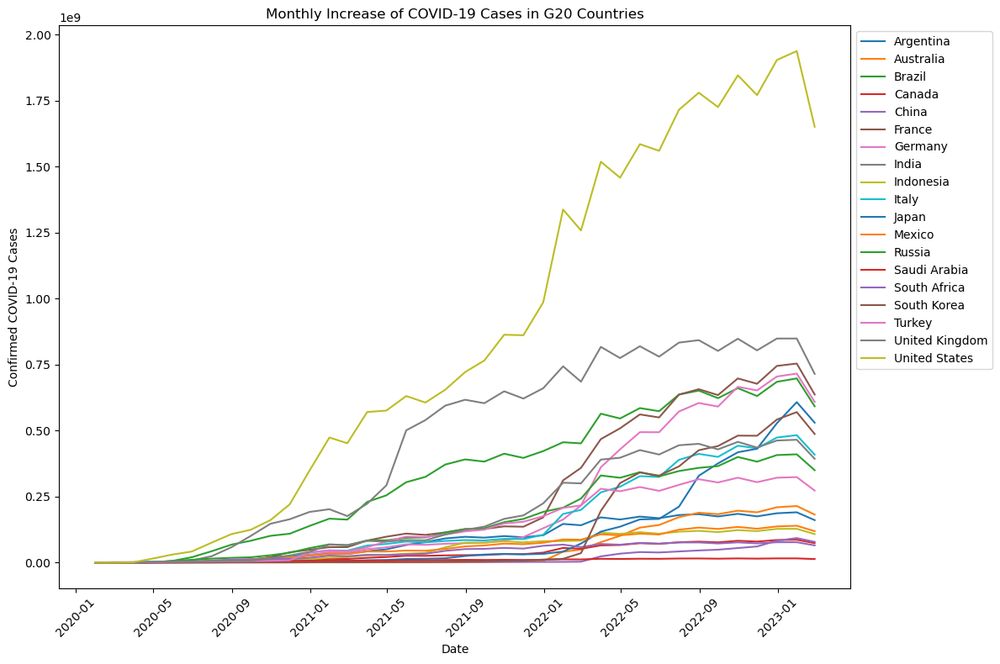

In [25]:
# Remove the columns
covid_g20 = covid_g20.drop(columns=['Province/State', 'Lat', 'Long'], errors='ignore')

# Filter the data for G20 countries using the 'Country/Region' column
covid_filtered_g20 = covid_g20[covid_g20['Country/Region'].isin(g20_countries)]

# Group by 'Country/Region' to sum any duplicate entries
covid_filtered_g20 = covid_filtered_g20.groupby('Country/Region').sum()

# Define the function to parse dates from columns
def try_parse_dates(columns):
    parsed_dates = []
    for col in columns:
        try:
            parsed_dates.append(pd.to_datetime(col, format='%m/%d/%y', errors='coerce'))
        except ValueError:
            parsed_dates.append(pd.NaT)
    return parsed_dates

# Apply the parsing function to the columns
parsed_columns = try_parse_dates(covid_filtered_g20.columns)

# Retain only the columns that were parsed successfully
valid_columns = [col for col, date in zip(covid_filtered_g20.columns, parsed_columns) if date is not pd.NaT]

# Now we'll reprocess the data with only valid columns
covid_g20_valid = covid_filtered_g20[valid_columns]

# Convert the valid columns to datetime format
covid_g20_valid.columns = pd.to_datetime(covid_g20_valid.columns, format='%m/%d/%y', errors='coerce')

# Resample the data by month and sum it up
monthly_covid_g20 = covid_g20_valid.resample('M', axis=1).sum()

# Plot the data
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

# Plot for each country
for country in monthly_covid_g20.index:
    plt.plot(monthly_covid_g20.columns, monthly_covid_g20.loc[country], label=country)

# Adding labels and title
plt.xlabel('Date')
plt.ylabel('Confirmed COVID-19 Cases')
plt.title('Monthly Increase of COVID-19 Cases in G20 Countries')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


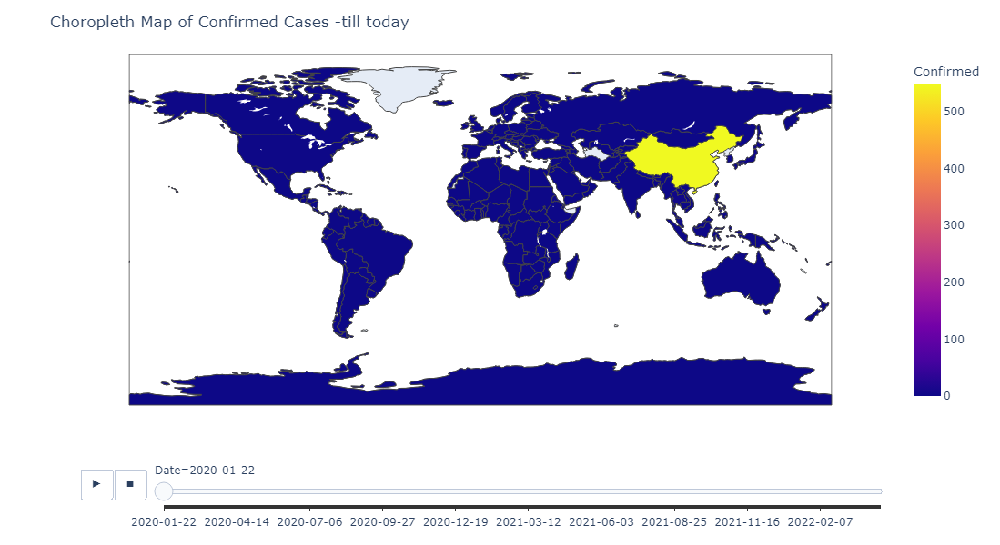

In [26]:
current_data = pd.read_csv('../Final Project/covid_countries_aggregated.csv')
fig = px.choropleth(current_data,locations='Country',locationmode='country names',color='Confirmed',animation_frame='Date')
fig.update_layout(title='Choropleth Map of Confirmed Cases -till today')
fig.update_layout(
    width=1000,  
    height=600   
)
fig.show()


## Resilience per cases

In [27]:
# Merge population and confirmed cases
g20_cases_population_df = g20_confirmed_cases_df.merge(g20_population_df, left_on='Country/Region', right_on='Country Name')

# Rename columns for clarity
g20_cases_population_df = g20_cases_population_df.rename(columns={
    'Country/Region': 'Country',
    '2/28/23': 'Confirmed Cases',
    '2023': 'Population'
})

# Calculate the ratio of confirmed cases per total population
g20_cases_population_df['Cases per Population'] = g20_cases_population_df['Confirmed Cases'] / g20_cases_population_df['Population']

# Select relevant columns 
g20_cases_population_cleaned = g20_cases_population_df[['Country', 'Population', 'Confirmed Cases', 'Cases per Population']]

# Convert the population column to be in millions
g20_cases_population_cleaned['Population (Millions)'] = g20_cases_population_cleaned['Population'] / 1e6

# Remove duplicates by country and keep the first occurrence
g20_cases_population_cleaned = g20_cases_population_cleaned.drop_duplicates(subset='Country')

# Select final columns to display
g20_cases_population_millions = g20_cases_population_cleaned[['Country', 'Population (Millions)', 'Confirmed Cases', 'Cases per Population']]

# Display the final DataFrame
g20_cases_population_millions


NameError: name 'g20_confirmed_cases_df' is not defined

In [ ]:

# Applying grading logic based on 'Deaths per Population'
def assign_grade(deaths_per_population):
    if 0.000001 < deaths_per_population <= 0.00001:
        return 100
    elif 0.00001 < deaths_per_population <= 0.0001:
        return 90
    elif 0.0001 < deaths_per_population <= 0.0005:
        return 80
    elif 0.0005 < deaths_per_population <= 0.001:
        return 70
    elif 0.001 < deaths_per_population <= 0.005:
        return 60
    elif 0.005 < deaths_per_population <= 0.01:
        return 50
    elif 0.01 < deaths_per_population <= 0.05:
        return 40
    elif 0.05 < deaths_per_population <= 0.1:
        return 30
    elif 0.1 < deaths_per_population <= 0.5:
        return 20
    elif 0.5 < deaths_per_population <= 1:
        return 10    
    else:
        return 0  

g20_cases_population_millions['Grade'] = g20_cases_population_millions['Cases per Population'].apply(assign_grade)


g20_cases_population_millions[['Country', 'Population (Millions)', 'Confirmed Cases', 'Cases per Population', 'Grade']]


In [ ]:
def get_color(grade):
    if grade == 100:
        return 'red'
    elif grade == 90:
        return 'orange'
    elif grade == 80:
        return 'purple'
    elif grade == 70:
        return 'pink'
    elif grade == 60:
        return 'black'
    elif grade == 50:
        return 'yellow'
    elif grade == 40:
        return 'green'
    elif grade == 30:
        return 'gray'
    elif grade == 20:
        return 'blue'
    else:
        return 'magenta'

colors = g20_cases_population_millions['Grade'].apply(get_color)

plt.figure(figsize=(12, 6))

plt.barh(g20_cases_population_millions['Country'], g20_cases_population_millions['Grade'], color=colors)

plt.xlabel('Grade')
plt.ylabel('Country')
plt.title('Grades of G20 Countries Based on Deaths per Population with Color Coding')

plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()


## COVID-19 Deaths

In [ ]:
file_path_deaths = '../Final Project/Annual COVID-19 Cases - G20/time_series_covid19_deaths_global.csv'
covid_deaths_data = pd.read_csv(file_path_deaths)

# Remove the columns: Province/State, Lat, Long
covid_deaths_data = covid_deaths_data.drop(columns=['Province/State', 'Lat', 'Long'], errors='ignore')

# Sum the amount of duplicates in the 'Country/Region' column and merge them
covid_deaths_data = covid_deaths_data.groupby('Country/Region').sum()

# Filter the data for G20 countries
covid_deaths_g20 = covid_deaths_data.loc[covid_deaths_data.index.isin(g20_countries)]

def try_parse_dates(columns):
    parsed_dates = []
    for col in columns:
        try:
            # '%m/%d/%y' format
            parsed_dates.append(pd.to_datetime(col, format='%m/%d/%y', errors='coerce'))
        except ValueError:
            #  (Not a Time)
            parsed_dates.append(pd.NaT)
    return parsed_dates

# Apply the parsing function to the columns
parsed_columns_deaths = try_parse_dates(covid_deaths_g20.columns)

# Retain only the columns that were parsed successfully (i.e., valid date columns)
valid_columns_deaths = [col for col, date in zip(covid_deaths_g20.columns, parsed_columns_deaths) if date is not pd.NaT]

# process the data with only valid columns
covid_deaths_g20_valid = covid_deaths_g20[valid_columns_deaths]

# Convert the valid columns to datetime format
covid_deaths_g20_valid.columns = pd.to_datetime(covid_deaths_g20_valid.columns, format='%m/%d/%y', errors='coerce')

# Resample the data by month and sum it up
monthly_covid_deaths_g20 = covid_deaths_g20_valid.resample('M', axis=1).sum()

monthly_covid_deaths_g20

In [ ]:

# Remove the columns: Province/State, Lat, Long
covid_deaths_data = covid_deaths_data.drop(columns=['Province/State', 'Lat', 'Long'], errors='ignore')

# Sum the amount of duplicates in the 'Country/Region' column and merge them
covid_deaths_data = covid_deaths_data.groupby('Country/Region').sum()

# Filter the data for G20 countries
covid_deaths_g20 = covid_deaths_data.loc[covid_deaths_data.index.isin(g20_countries)]

def try_parse_dates(columns):
    parsed_dates = []
    for col in columns:
        try:
            parsed_dates.append(pd.to_datetime(col, format='%m/%d/%y', errors='coerce'))
        except ValueError:
            parsed_dates.append(pd.NaT)
    return parsed_dates

# Apply the parsing function to the columns
parsed_columns_deaths = try_parse_dates(covid_deaths_g20.columns)

# Retain only the columns that were parsed successfully (i.e., valid date columns)
valid_columns_deaths = [col for col, date in zip(covid_deaths_g20.columns, parsed_columns_deaths) if date is not pd.NaT]

# Now we'll reprocess the data with only valid columns
covid_deaths_g20_valid = covid_deaths_g20[valid_columns_deaths]

# Convert the valid columns to datetime format
covid_deaths_g20_valid.columns = pd.to_datetime(covid_deaths_g20_valid.columns, format='%m/%d/%y', errors='coerce')

# Resample the data by month and sum it up
monthly_covid_deaths_g20 = covid_deaths_g20_valid.resample('M', axis=1).sum()

# Plot the data for deaths
plt.figure(figsize=(12, 8))

# Plot for each country
for country in monthly_covid_deaths_g20.index:
    plt.plot(monthly_covid_deaths_g20.columns, monthly_covid_deaths_g20.loc[country], label=country)

# Adding labels and title
plt.xlabel('Date')
plt.ylabel('Confirmed COVID-19 Deaths')
plt.title('Monthly Increase of COVID-19 Deaths in G20 Countries')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
current_data = pd.read_csv('../Final Project/covid_countries_aggregated.csv')
fig = px.choropleth(current_data,locations='Country',locationmode='country names',color='Deaths',animation_frame='Date')
fig.update_layout(title='Choropleth Map of Deaths -till today', template="plotly_dark")
fig.update_layout(
    width=1000,  
    height=600  
)
fig.show()


## Resilience per Deaths

In [ ]:
g20_death_population_df = covid_deaths_data.merge(g20_population_df, left_on='Country/Region', right_on='Country Name')

# Renaming columns 
g20_death_population_df = g20_death_population_df.rename(columns={
    'Country/Region': 'Country Name',
    '2/28/23': 'Death Cases',
    '2023': 'Population'
})

# Calculate the ratio of death cases per total population
g20_death_population_df['Deaths per Population'] = g20_death_population_df['Death Cases'] / g20_death_population_df['Population']

# Convert the population column to be in millions
g20_death_population_df['Population (Millions)'] = g20_death_population_df['Population'] / 1e6

# Remove duplicates by country and keep the first occurrence
g20_death_population_cleaned = g20_death_population_df.drop_duplicates(subset='Country Name')

# Select columns
g20_death_population_millions = g20_death_population_cleaned[['Country Name', 'Population (Millions)', 'Death Cases', 'Deaths per Population']]

g20_death_population_millions


In [ ]:

def assign_grade(deaths_per_population):
    if 0.00001 < deaths_per_population <= 0.0001:
        return 100
    elif 0.0001 < deaths_per_population <= 0.0005:
        return 80
    elif 0.0005 < deaths_per_population <= 0.001:
        return 60
    elif 0.001 < deaths_per_population <= 0.005:
        return 40
    elif 0.005 < deaths_per_population <= 0.01:
        return 20
    else:
        return 0  

# Apply  grading function to the 'Deaths per Population' column
g20_death_population_millions['Grade'] = g20_death_population_millions['Deaths per Population'].apply(assign_grade)

g20_death_population_millions[['Country Name', 'Population (Millions)', 'Death Cases', 'Deaths per Population', 'Grade']]


In [ ]:
def get_color(grade):
    if grade == 100:
        return 'red'
    elif grade == 80:
        return 'orange'
    elif grade == 60:
        return 'purple'
    elif grade == 40:
        return 'blue'
    elif grade == 20:
        return 'black'
    else:
        return 'magenta'

# Apply the color mapping based on the grade
colors = g20_death_population_millions['Grade'].apply(get_color)

# Replot the graph with colors mapped according to the grades
plt.figure(figsize=(12, 6))

# Plot the horizontal bar chart for each country's grade with assigned colors
plt.barh(g20_death_population_millions['Country Name'], g20_death_population_millions['Grade'], color=colors)

# Add labels and title
plt.xlabel('Grade')
plt.ylabel('Country Name')
plt.title('Grades of G20 Countries Based on Deaths per Population with Color Coding')

# Invert y-axis to display countries in the correct order
plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()


______________________________________________________________________________________________________________________________________________________

# Resilience Index

In [ ]:
data1 = {
    'Country Name': ['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Germany', 'France', 'United Kingdom', 
                     'Indonesia', 'India', 'Italy', 'Japan', 'South Korea', 'Mexico', 'Russia', 'Saudi Arabia', 
                     'Turkey', 'United States', 'South Africa'],
    'Grade': [10, 20, 20, 20, 80, 50, 30, 40, 20, 40, 30, 50, 20, 20, 20, 10, 10, 90, 10]
}

data2 = {
    'Country Name': ['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Germany', 'France', 'United Kingdom', 
                     'Indonesia', 'India', 'Italy', 'Japan', 'South Korea', 'Mexico', 'Russia', 'Saudi Arabia', 
                     'Turkey', 'United States', 'South Africa'],
    'Grade': [80, 50, 40, 50, 60, 40, 30, 40, 50, 60, 40, 10, 20, 80, 60, 60, 90, 60, 10]
}

data3 = {
    'Country Name': ['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Germany', 'France', 'United Kingdom', 
                     'Indonesia', 'India', 'Italy', 'Japan', 'South Korea', 'Mexico', 'Russia', 'Saudi Arabia', 
                     'Turkey', 'United States', 'South Africa'],
    'Grade': [20, 50, 90, 20, 20, 10, 20, 20, 30, 80, 80, 10, 20, 0, 60, 10, 100, 30, 90]
}

data4 = {
    'Country Name': ['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Germany', 'France', 'United Kingdom', 
                     'Indonesia', 'India', 'Italy', 'Japan', 'South Korea', 'Mexico', 'Russia', 'Saudi Arabia', 
                     'Turkey', 'United States', 'South Africa'],
    'Grade': [20, 30, 20, 30, 100, 40, 30, 40, 30, 100, 40, 40, 40, 40, 30, 20, 20, 30, 20]
}

data5 = {
    'Country Name': ['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Germany', 'France', 'United Kingdom', 
                     'Indonesia', 'India', 'Italy', 'Japan', 'South Korea', 'Mexico', 'Russia', 'Saudi Arabia', 
                     'Turkey', 'United States', 'South Africa'],
    'Grade': [40, 60, 40, 40, 100, 40, 40, 40, 60, 80, 40, 60, 60, 40, 40, 80, 40, 40, 40]
}

data6 = {
    'Country Name': ['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Germany', 'France', 'United Kingdom', 
                     'Indonesia', 'India', 'Italy', 'Japan', 'South Korea', 'Mexico', 'Russia', 'Saudi Arabia', 
                     'Turkey', 'United States', 'South Africa'],
    'Grade': [20, 60, 40, 40, 100, 40, 40, 90, 40, 80, 40, 60, 60, 40, 40, 80, 40, 40, 40]
}

# Convert to DataFrames
df1 = pd.DataFrame(data1)
df2 = pd.DataFrame(data2)
df3 = pd.DataFrame(data3)
df4 = pd.DataFrame(data4)
df5 = pd.DataFrame(data5)
df6 = pd.DataFrame(data6)

# Merging the dataframes on 'Country Name'
merged_df = df1.merge(df2, on='Country Name', suffixes=('_1', '_2')).merge(df3, on='Country Name') \
    .merge(df4, on='Country Name', suffixes=('_3', '_4')).merge(df5, on='Country Name', suffixes=('_5', '_6')) \
    .merge(df6, on='Country Name', suffixes=('_7', '_8'))

# Renaming the columns correctly
merged_df.columns = ['Country Name', 'Grade_1', 'Grade_2', 'Grade_3', 'Grade_4', 'Grade_5', 'Grade_6']

# Summing all grades for each country
merged_df['Total Grade'] = merged_df[['Grade_1', 'Grade_2', 'Grade_3', 'Grade_4', 'Grade_5', 'Grade_6']].sum(axis=1)

# Sorting by the total grade in descending order
resilience_df = merged_df[['Country Name', 'Total Grade']].sort_values(by='Total Grade', ascending=False)
resilience_df.index = range(1, len(merged_df) + 1)

resilience_df

In [ ]:
plt.figure(figsize=(12, 6))

# Create a heatmap 
sns.heatmap(merged_df.set_index('Country Name').T, annot=False, cmap='coolwarm', cbar_kws={'label': 'Total Grade'})

plt.title('Resilience for G20 Countries')
plt.xlabel('Country')
plt.ylabel('')

plt.tight_layout()
plt.show()

In [ ]:
fig = px.choropleth(merged_df, 
                    locations="Country Name", 
                    locationmode="country names",
                    color="Total Grade", 
                    hover_name="Country Name",
                    color_continuous_scale=px.colors.sequential.Magma, 
                    title="Resilience by Country")

fig.update_layout(
    width=1000,  
    height=600   
)

fig.show()

In [ ]:
# Define the data
data1 = {
    'Country Name': ['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Germany', 'France', 'United Kingdom', 
                     'Indonesia', 'India', 'Italy', 'Japan', 'South Korea', 'Mexico', 'Russia', 'Saudi Arabia', 
                     'Turkey', 'United States', 'South Africa'],
    'Grade': [10, 20, 20, 20, 80, 50, 30, 40, 20, 40, 30, 50, 20, 20, 20, 10, 10, 90, 10]
}
# Grade 1 = Nominal GDP
# Grade 2 = GDP per capita
# Grade 3 = GDP Growth
# Grade 4 = GDP Expenses
# Grade 5 = COVID cases
# Grade 6 = COVID deaths

# Convert data to DataFrames
df1 = pd.DataFrame(data1)
df2 = pd.DataFrame(data2)
df3 = pd.DataFrame(data3)
df4 = pd.DataFrame(data4)
df5 = pd.DataFrame(data5)
df6 = pd.DataFrame(data6)

# Merging the dataframes on 'Country Name'
merged_df = df1.merge(df2, on='Country Name', suffixes=('_1', '_2')).merge(df3, on='Country Name') \
    .merge(df4, on='Country Name', suffixes=('_3', '_4')).merge(df5, on='Country Name', suffixes=('_5', '_6')) \
    .merge(df6, on='Country Name', suffixes=('_7', '_8'))

# Renaming the columns correctly
merged_df.columns = ['Country Name', 'Grade_1', 'Grade_2', 'Grade_3', 'Grade_4', 'Grade_5', 'Grade_6']

# Summing all grades for each country
merged_df['Total Grade'] = merged_df[['Grade_1', 'Grade_2', 'Grade_3', 'Grade_4', 'Grade_5', 'Grade_6']].sum(axis=1)

# Initialize the Dash app
app = dash.Dash(__name__)

# Layout of the dashboard
app.layout = html.Div([
    html.H1("Country Grade Dashboard"),
    
    # Dropdown for selecting country
    html.Div([
        html.Label("Select Country"),
        dcc.Dropdown(
            id='country-dropdown',
            options=[{'label': country, 'value': country} for country in merged_df['Country Name'].unique()],
            value='United States',
            multi=False
        ),
    ], style={'width': '48%', 'display': 'inline-block'}),
    
    # Graph to display Grade trends
    dcc.Graph(id='grade-trend-graph'),

    # Slider to filter by dataset (1 to 6)
    dcc.Slider(
        id='grade-slider',
        min=1,
        max=6,
        value=6,
        marks={i: f'Grade {i}' for i in range(1, 7)},
        step=1,
    ),

    # Graph to compare Total Grades across countries
    dcc.Graph(id='total-grade-comparison')
])

# Define callback to update Grade trend graph
@app.callback(
    Output('grade-trend-graph', 'figure'),
    [Input('country-dropdown', 'value'), Input('grade-slider', 'value')]
)
def update_grade_trend(selected_country, selected_grade):
    country_data = merged_df[merged_df['Country Name'] == selected_country]
    grades = country_data.iloc[0, 1:selected_grade+1].values
    grade_labels = [f'Grade {i}' for i in range(1, selected_grade+1)]

    trace = go.Scatter(
        x=grade_labels,
        y=grades,
        mode='lines+markers',
        name=selected_country
    )

    return {
        'data': [trace],
        'layout': go.Layout(
            title=f'Grades Trend for {selected_country}',
            xaxis={'title': 'Grade Dataset'},
            yaxis={'title': 'Grade'},
            hovermode='closest'
        )
    }

# Define callback to update Total Grade comparison graph
@app.callback(
    Output('total-grade-comparison', 'figure'),
    [Input('grade-slider', 'value')]
)
def update_total_grade_comparison(selected_grade):
    total_grades = merged_df[['Country Name'] + [f'Grade_{i}' for i in range(1, selected_grade+1)]]
    total_grades['Total'] = total_grades.iloc[:, 1:].sum(axis=1)
    total_grades = total_grades.sort_values(by='Total', ascending=False)

    trace = go.Bar(
        x=total_grades['Country Name'],
        y=total_grades['Total'],
        name='Total Grade Comparison'
    )

    return {
        'data': [trace],
        'layout': go.Layout(
            title='Total Resilience Comparison Across Countries',
            xaxis={'title': 'Country'},
            yaxis={'title': 'Total Grade'},
            hovermode='closest'
        )
    }

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


# Linear Regression

In [ ]:
# Define independent variables (Grade_1 to Grade_5) and the dependent variable (Grade_6)
X = merged_df[['Grade_1', 'Grade_2', 'Grade_3', 'Grade_4', 'Grade_5']]
y = merged_df['Grade_6']

# Split data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create regression model
reg_model = LinearRegression()
reg_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = reg_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R² Score: {r2}")

# Plotting the actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', label='Predicted vs Actual')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2, label='Ideal Fit Line')
plt.xlabel("Actual Grade_6")
plt.ylabel("Predicted Grade_6")
plt.title("Actual vs Predicted Grades (Grade_6)")
plt.legend()
plt.show()
